<a id="3"></a>
# <p style="padding:10px;background-color:#fda628 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Import Libraries </p>

In [25]:
import warnings
warnings.filterwarnings("ignore")
from numpy import asarray
import numpy as np
import pandas as pd
from PIL import Image
import cv2
import glob
import os 
import random
import subprocess
import matplotlib.pyplot as plt
from skimage.io import imread
from matplotlib.patches import Rectangle
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, Input, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy

<a id="4"></a>
# <p style="padding:10px;background-color:#fda628 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Import Dataset </p>

<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **Calling the images from directory**

  - There is 5 differente folder for each class. We have to call them to the different variables. For this purpose, I create 5 empty lists and with some **for loop** for iterating in folders with **os.listdir**. After that we can use a **if** for add images with **png** or **jpg** formats.
   You can see these methods in the cell below.


In [26]:
image_list_other = []
image_list_safe = []
image_list_talking = []
image_list_text = []
image_list_turn = []

for other in os.listdir("/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities"): 
    if other.endswith(".png") or other.endswith(".jpg"): 
        image_list_other.append(os.path.join("/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities",
                                             other))
        print(os.path.join("/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities", other))
        
for safe in os.listdir("/kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving"): 
    if safe.endswith(".png") or safe.endswith(".jpg"): 
        image_list_safe.append(os.path.join("/kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving", 
                                            safe))
        print(os.path.join("/kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving",
                           safe))
        
for talking in os.listdir("/kaggle/input/revitsone-5class/Revitsone-5classes/talking_phone"): 
    if talking.endswith(".png") or talking.endswith(".jpg"): 
        image_list_talking.append(os.path.join("/kaggle/input/revitsone-5class/Revitsone-5classes/talking_phone", 
                                               talking))
        print(os.path.join("/kaggle/input/revitsone-5class/Revitsone-5classes/talking_phone",
                           talking))
        
for text in os.listdir("/kaggle/input/revitsone-5class/Revitsone-5classes/texting_phone"): 
    if text.endswith(".png") or text.endswith(".jpg"): 
        image_list_text.append(os.path.join("/kaggle/input/revitsone-5class/Revitsone-5classes/texting_phone",
                                            text))
        print(os.path.join("/kaggle/input/revitsone-5class/Revitsone-5classes/texting_phone",
                           text))
        
for turn in os.listdir("/kaggle/input/revitsone-5class/Revitsone-5classes/turning"): 
    if turn.endswith(".png") or turn.endswith(".jpg"): 
        image_list_turn.append(os.path.join("/kaggle/input/revitsone-5class/Revitsone-5classes/turning",
                                            turn))
        print(os.path.join("/kaggle/input/revitsone-5class/Revitsone-5classes/turning", 
                           turn))
    
    

/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_25688.jpg
/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_10731.jpg
/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_19798.jpg
/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_4207.jpg
/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_24816.jpg
/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_5355.jpg
/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_4541.jpg
/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_6690.jpg
/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_3114.jpg
/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_12714.jpg
/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_17534.jpg
/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_12892.jpg
/kaggle/input/revitsone-5class/Re

<a id="5"></a>
# <p style="padding:10px;background-color:#fab72f ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Pre Modeling </p>

<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **1. Delete unreadable images**

  - Sometimes we have some unreadable images that machine cannot read these images. There are two ways for handling these images. 1- Finding these images on our own way and exploring in the dataset if the dataset has little images (like this case). 2- We can create some functions that allow machine to iterate in images for finding out that which images are readable or not. 
   
   


In [27]:
image_list_other.remove('/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_79.jpg')
image_list_other.remove('/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_4664.jpg')
image_list_other.remove('/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_7973.jpg')
image_list_other.remove('/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_13318.jpg')
image_list_other.remove('/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_13396.jpg')
image_list_other.remove('/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_13541.jpg')
image_list_other.remove('/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_13625.jpg')
image_list_other.remove('/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_20398.jpg')
image_list_other.remove('/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities/img_22266.jpg')

image_list_turn.remove('/kaggle/input/revitsone-5class/Revitsone-5classes/turning/img_8771.jpg')
image_list_turn.remove('/kaggle/input/revitsone-5class/Revitsone-5classes/turning/img_62337.jpg')
image_list_turn.remove('/kaggle/input/revitsone-5class/Revitsone-5classes/turning/img_67523.jpg')
image_list_turn.remove('/kaggle/input/revitsone-5class/Revitsone-5classes/turning/img_70552.jpg')
image_list_turn.remove('/kaggle/input/revitsone-5class/Revitsone-5classes/turning/img_84605.jpg')
image_list_turn.remove('/kaggle/input/revitsone-5class/Revitsone-5classes/turning/img_101434.jpg')

In [114]:
font = {'family':'Times New Roman','color':'#1f211f'}
background_color = '#fab72f'

<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **2. Plot random images from each class**

  - This part is for better understanding the images that we have. 
   
   


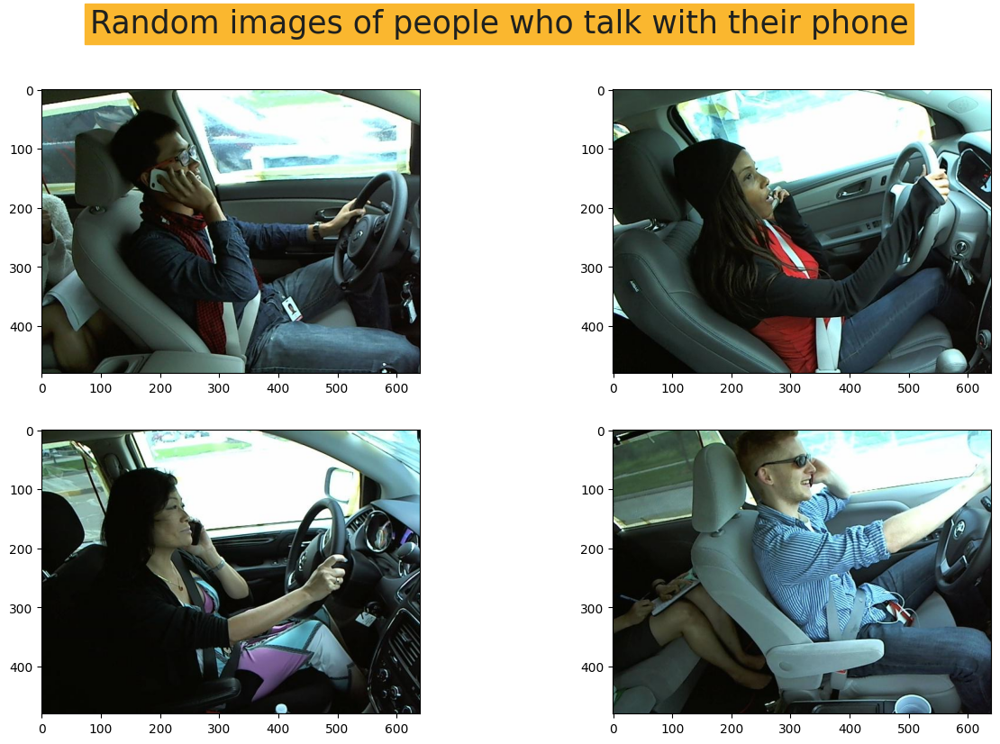

In [29]:
plt.figure(1, figsize=(15, 9))
plt.axis('off')
n = 0
for i in range(4):
    
    n += 1
    random_img = random.choice(image_list_talking)
    imgs = imread(random_img)
    plt.suptitle("Random images of people who talk with their phone",
                 fontdict = font, fontsize=25
                 ,backgroundcolor= background_color)
    plt.subplot(2,2,n)
    plt.imshow(imgs)

plt.show()

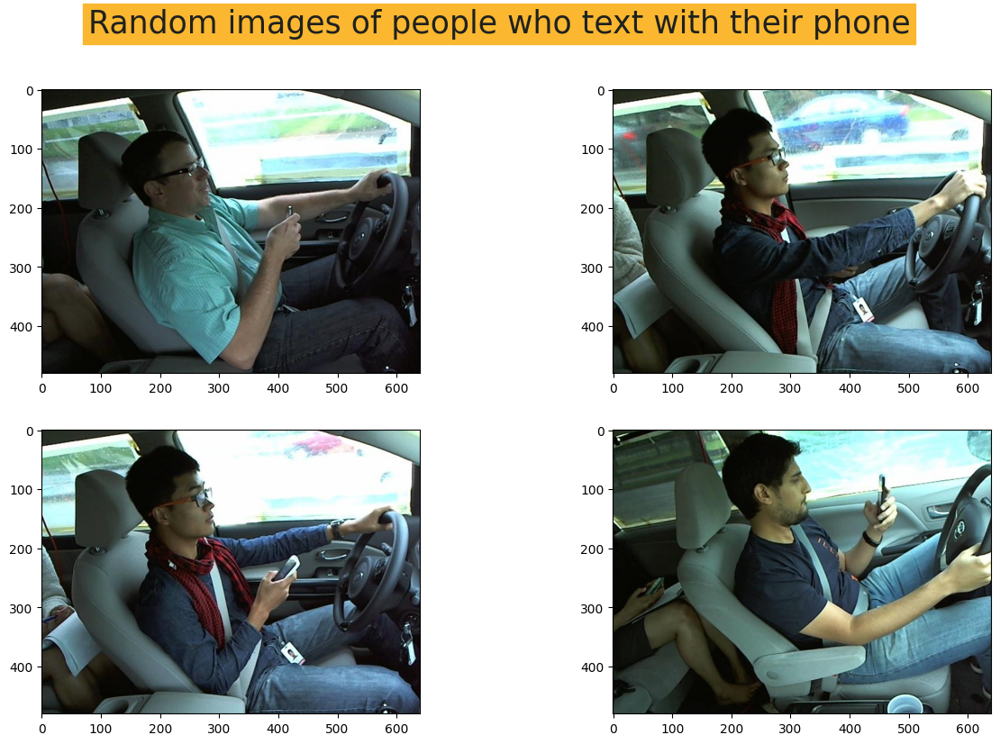

In [30]:
plt.figure(1, figsize=(15, 9))
plt.axis('off')
n = 0
for i in range(4):
    
    n += 1
    random_img = random.choice(image_list_text)
    imgs = imread(random_img)
    plt.suptitle("Random images of people who text with their phone",
                 fontdict = font, fontsize=25
                 ,backgroundcolor=background_color)
    plt.subplot(2,2,n)
    plt.imshow(imgs)

plt.show()

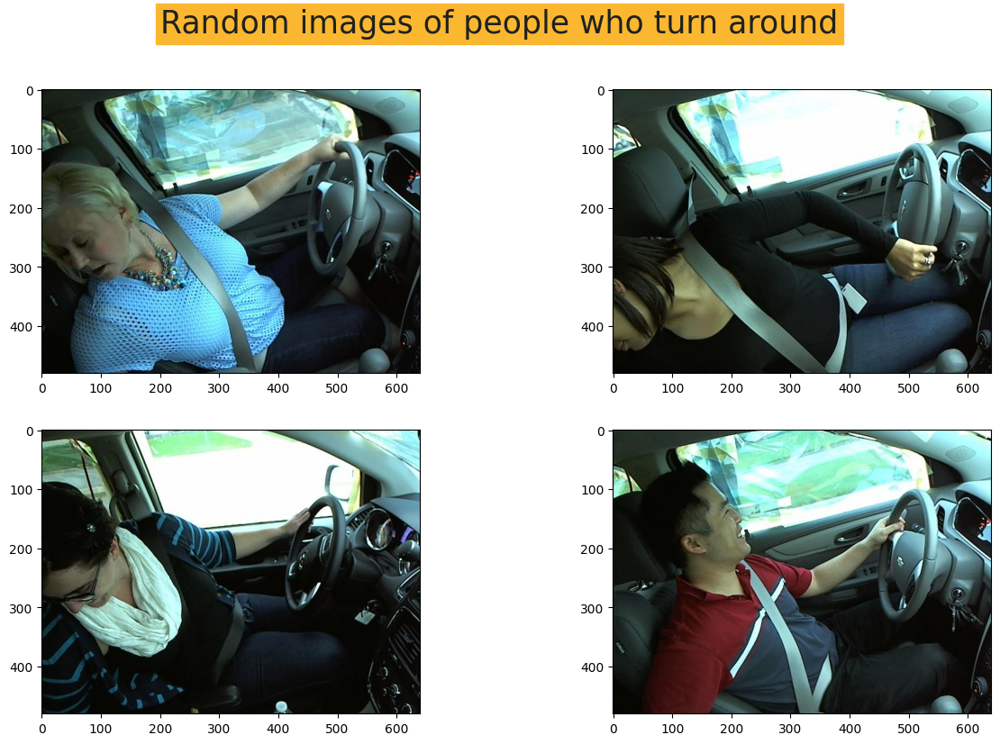

In [31]:
plt.figure(1, figsize=(15, 9))
plt.axis('off')
n = 0
for i in range(4):
    
    n += 1
    random_img = random.choice(image_list_turn)
    imgs = imread(random_img)
    plt.suptitle("Random images of people who turn around",
                 fontdict = font, fontsize=25
                 ,backgroundcolor=background_color)
    plt.subplot(2,2,n)
    plt.imshow(imgs)

plt.show()

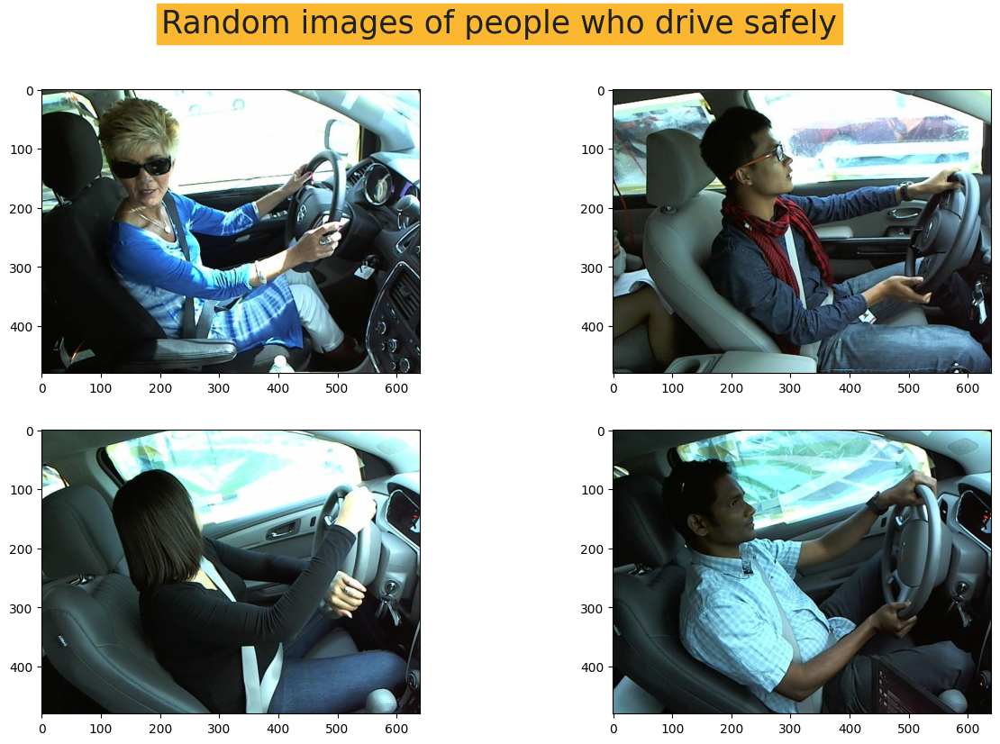

In [32]:
plt.figure(1, figsize=(15, 9))
plt.axis('off')
n = 0
for i in range(4):
    
    n += 1
    random_img = random.choice(image_list_safe)
    imgs = imread(random_img)
    plt.suptitle("Random images of people who drive safely",
                 fontdict = font, fontsize=25
                 ,backgroundcolor=background_color)
    plt.subplot(2,2,n)
    plt.imshow(imgs)

plt.show()

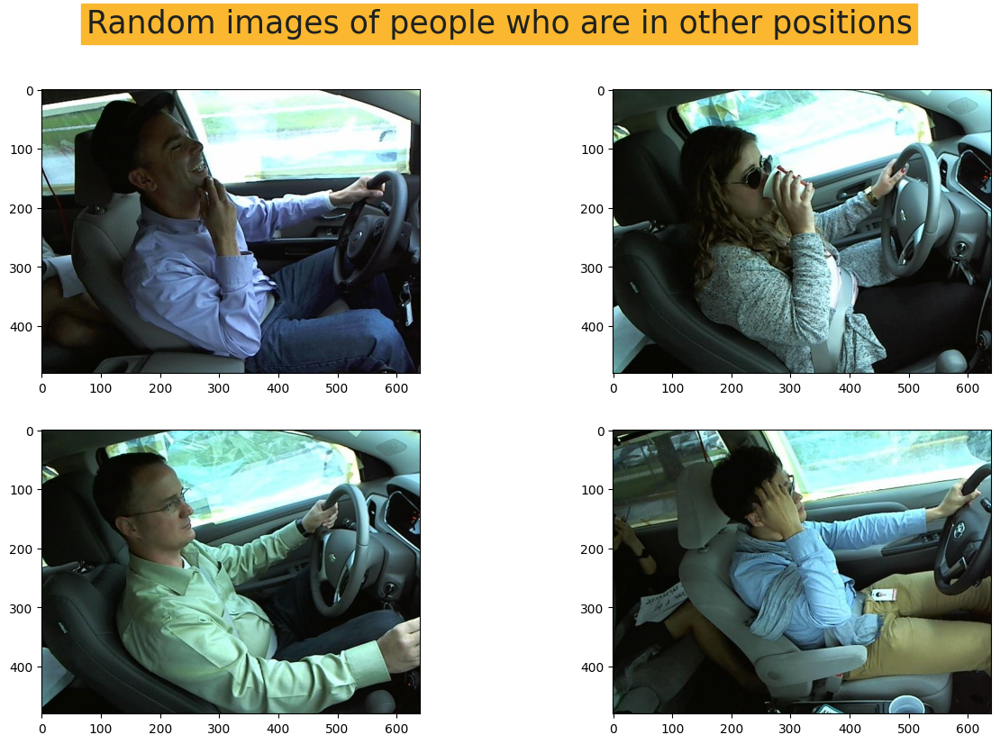

In [33]:
plt.figure(1, figsize=(15, 9))
plt.axis('off')
n = 0
for i in range(4):
    
    n += 1
    random_img = random.choice(image_list_other)
    imgs = imread(random_img)
    plt.suptitle("Random images of people who are in other positions",
                 fontdict = font, fontsize=25
                 ,backgroundcolor=background_color)
    plt.subplot(2,2,n)
    plt.imshow(imgs)

plt.show()

<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **3. Split data to train, test, prediction**

  - I deciede to devide dataset in this situation: 1- train = 75%, 2- test = 15% and 3- valid = 5%
   
   


In [34]:
print("Number of samples in (Class = Other) = " ,len(image_list_other))
print("Number of samples in (Class = Safe Driving) = " ,len(image_list_safe))
print("Number of samples in (Class = Talking Phone) = " ,len(image_list_talking))
print("Number of samples in (Class = Texting Phone) = " ,len(image_list_text))
print("Number of samples in (Class = Turning) = " ,len(image_list_turn))

Number of samples in (Class = Other) =  2119
Number of samples in (Class = Safe Driving) =  2203
Number of samples in (Class = Talking Phone) =  2169
Number of samples in (Class = Texting Phone) =  2203
Number of samples in (Class = Turning) =  2057


In [35]:
print(.75*len(image_list_other) , .2*len(image_list_other) ,.05*len(image_list_other))
print(.75*len(image_list_safe) , .2*len(image_list_safe) ,.05*len(image_list_safe))
print(.75*len(image_list_talking) , .2*len(image_list_talking) ,.05*len(image_list_talking))
print(.75*len(image_list_text) , .2*len(image_list_text) ,.05*len(image_list_text))
print(.75*len(image_list_turn) , .2*len(image_list_turn) ,.05*len(image_list_turn))

1589.25 423.8 105.95
1652.25 440.6 110.15
1626.75 433.8 108.45
1652.25 440.6 110.15
1542.75 411.40000000000003 102.85000000000001


In [36]:
print("Train","Test", "Valid")

train_other = image_list_other[:1589]
test_other = image_list_other[1589:2012]
valid_other = image_list_other[2012:]

print (len(train_other), len(test_other), len(valid_other))

train_safe = image_list_safe[:1652]
test_safe = image_list_safe[1652:2092]
valid_safe = image_list_safe[2092:]

print (len(train_safe), len(test_safe), len(valid_safe))

train_talking = image_list_talking[:1626]
test_talking = image_list_talking[1626:2059]
valid_talking = image_list_talking[2059:]

print (len(train_talking), len(test_talking), len(valid_talking))

train_text = image_list_text[:1652]
test_text = image_list_text[1652:2092]
valid_text = image_list_text[2092:]

print (len(train_text), len(test_text), len(valid_text))

train_turn = image_list_turn[:1547]
test_turn = image_list_turn[1547:1959]
valid_turn = image_list_turn[1959:]

print (len(train_turn), len(test_turn), len(valid_turn))

Train Test Valid
1589 423 107
1652 440 111
1626 433 110
1652 440 111
1547 412 98


<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **4. Create dataframes for train, test, prediction**

  - If you don't want to use directly from the directories and you want to create some lists of images, you can turn the format of data to dataframes and use **flow from dataframe** method that we see in the next cells.
    For this approach, create a **label** column for use it as a tag or label
   


In [37]:
train_other_df = pd.DataFrame({'image':train_other, 'label':'Other'})
train_safe_df = pd.DataFrame({'image':train_safe, 'label':'Safe'})
train_talking_df = pd.DataFrame({'image':train_talking, 'label':'Talk'})
train_text_df = pd.DataFrame({'image':train_text, 'label':'Text'})
train_turn_df = pd.DataFrame({'image':train_turn, 'label':'Turn'})

In [38]:
test_other_df = pd.DataFrame({'image':test_other, 'label':'Other'})
test_safe_df = pd.DataFrame({'image':test_safe, 'label':'Safe'})
test_talking_df = pd.DataFrame({'image':test_talking, 'label':'Talk'})
test_text_df = pd.DataFrame({'image':test_text, 'label':'Text'})
test_turn_df = pd.DataFrame({'image':test_turn, 'label':'Turn'})

In [39]:
valid_other_df = pd.DataFrame({'image':valid_other, 'label':'Other'})
valid_safe_df = pd.DataFrame({'image':valid_safe, 'label':'Safe'})
valid_talking_df = pd.DataFrame({'image':valid_talking, 'label':'Talk'})
valid_text_df = pd.DataFrame({'image':valid_text, 'label':'Text'})
valid_turn_df = pd.DataFrame({'image':valid_turn, 'label':'Turn'})

In [40]:
train_df = pd.concat([train_other_df, train_safe_df, train_talking_df, train_text_df, train_turn_df])
test_df = pd.concat([test_other_df, test_safe_df, test_talking_df, test_text_df, test_turn_df])
val_df = pd.concat([valid_other_df, valid_safe_df, valid_talking_df, valid_text_df, valid_turn_df])

In [41]:
train_df.head()

,image,label
0,/kaggle/input/revitsone-5class/Revitsone-5clas...,Other
1,/kaggle/input/revitsone-5class/Revitsone-5clas...,Other
2,/kaggle/input/revitsone-5class/Revitsone-5clas...,Other
3,/kaggle/input/revitsone-5class/Revitsone-5clas...,Other
4,/kaggle/input/revitsone-5class/Revitsone-5clas...,Other


In [42]:
print("Number of rows in train dataframe is: ", len(train_df))
print("Number of rows in test dataframe is: ", len(test_df))
print("Number of rows in val dataframe is: ", len(val_df))

Number of rows in train dataframe is:  8066
Number of rows in test dataframe is:  2148
Number of rows in val dataframe is:  537


<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **5. Calculate the ratio of images**

  - It's really important in some cases for knowing the ratio of images that we use. We can use **cv2.imread** for this part.
   


In [43]:
random_img_height = random.choice(train_other)

In [44]:
image= cv2.imread(random_img_height)

height, width= image.shape[:2]

print("The height is ", height)

print("The width is ", width)

The height is  384
The width is  683


<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **6. Define hyperparameters**

  - Some of the hyperparameters should be considering before the model goes to start. I set Batch size as 64, ofcourse you can use 32 or any other popular numbers or you can use some functions for checking the best number of that but it costs lots of run time and I just want to pick some experimental value. Also for AlexNet, ResNet and VGGNet its popular to use height and width as a 240*240 format.
   


In [45]:
Batch_size = 64
Img_height = 240
Img_width = 240

<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **7. Rescale the images**

  - Its really important to rescale the images and put all of the images in a same shape for input layer of model. 
   


In [46]:
trainGenerator = ImageDataGenerator(rescale=1./255.)
valGenerator = ImageDataGenerator(rescale=1./255.)
testGenerator = ImageDataGenerator(rescale=1./255.)

<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **8. Input Model**

  - Now we can use **flow from dataframe** that mentioned before. It helps to call images from some dataframes and mention the label as target.
   


In [47]:
trainDataset = trainGenerator.flow_from_dataframe(
  dataframe=train_df,
  class_mode="categorical",
  x_col="image",
  y_col="label",
  batch_size=Batch_size,
  seed=42,
  shuffle=True,
  target_size=(Img_height,Img_width) #set the height and width of the images
)

testDataset = testGenerator.flow_from_dataframe(
  dataframe=test_df,
  class_mode='categorical',
  x_col="image",
  y_col="label",
  batch_size=Batch_size,
  seed=42,
  shuffle=True,
  target_size=(Img_height,Img_width)
)

valDataset = valGenerator.flow_from_dataframe(
  dataframe=val_df,
  class_mode='categorical',
  x_col="image",
  y_col="label",
  batch_size=Batch_size,
  seed=42,
  shuffle=True,
  target_size=(Img_height,Img_width)
)

Found 8066 validated image filenames belonging to 5 classes.
Found 2148 validated image filenames belonging to 5 classes.
Found 537 validated image filenames belonging to 5 classes.


<a id="6"></a>
# <p style="padding:10px;background-color:#fab72f ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">AlexNet </p>

<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **1. What is AlexNet?**

  - AlexNet is a convolutional neural network (CNN) architecture that was introduced by Alex Krizhevsky, Ilya Sutskever, and Geoffrey Hinton in 2012. It is used primarily for image recognition and classification tasks. AlexNet was the winner of the ImageNet Large Scale Visual Recognition Challenge in 2012, which marked a breakthrough in deep learning. The network contains eight layers; the first five are convolutional layers, some of them followed by max-pooling layers, and the last three are fully connected layers. The network is split into two copies, each run on one GPU. AlexNet uses ReLU activation functions and dropout regularization to prevent overfitting. The architecture of AlexNet has inspired many other CNN architectures that have been developed since its introduction.
   


<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **2. Model Structure**

  - You can see the structure of AlexNet in the cell below.
   


In [48]:
def AlexNet():
    inp = layers.Input((240, 240, 3))
    x = layers.Conv2D(96, 11, 4, activation='relu')(inp)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(3, 2)(x)
    x = layers.Conv2D(256, 5, 1, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(3, 2)(x)
    x = layers.Conv2D(384, 3, 1, activation='relu')(x)
    x = layers.Conv2D(384, 3, 1, activation='relu')(x)
    x = layers.Conv2D(256, 3, 1, activation='relu')(x)
    x = layers.MaxPooling2D(3, 2)(x)
    x = layers.Flatten()(x)
    x = layers.Dense(4096, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(4096, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(5, activation='softmax')(x)

    model_Alex = models.Model(inputs=inp, outputs=x)

    return model_Alex

model_Alex = AlexNet()
model_Alex.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 conv2d_5 (Conv2D)           (None, 58, 58, 96)        34944     
                                                                 
 batch_normalization_2 (Batc  (None, 58, 58, 96)       384       
 hNormalization)                                                 
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 28, 28, 96)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 24, 24, 256)       614656    
                                                                 
 batch_normalization_3 (Batc  (None, 24, 24, 256)      1024

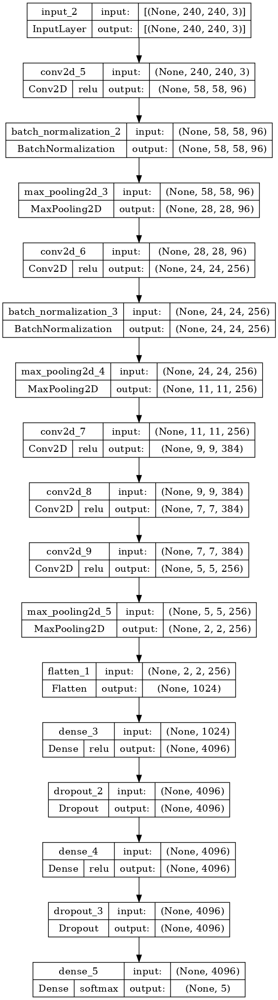

In [49]:
tf.keras.utils.plot_model(
    model_Alex,
    to_file='alex_model.png',
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    show_layer_activations=True,
    dpi=100
)

In [50]:
model_Alex.compile(loss=BinaryCrossentropy(),
              optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

In [51]:
Alex_model = model_Alex.fit(trainDataset, epochs=20, validation_data=valDataset)
model_Alex.save_weights('/kaggle/working/model_Alex.h5')

Epoch 1/20
127/127 [==============================] - 71s 499ms/step - loss: 0.5306 - accuracy: 0.3913 - val_loss: 0.5193 - val_accuracy: 0.3184
Epoch 2/20
127/127 [==============================] - 37s 295ms/step - loss: 0.2601 - accuracy: 0.7144 - val_loss: 0.2290 - val_accuracy: 0.7486
Epoch 3/20
127/127 [==============================] - 38s 297ms/step - loss: 0.1520 - accuracy: 0.8514 - val_loss: 0.1531 - val_accuracy: 0.8324
Epoch 4/20
127/127 [==============================] - 38s 301ms/step - loss: 0.0979 - accuracy: 0.9088 - val_loss: 0.1974 - val_accuracy: 0.7933
Epoch 5/20
127/127 [==============================] - 38s 300ms/step - loss: 0.0959 - accuracy: 0.9152 - val_loss: 0.0924 - val_accuracy: 0.9032
Epoch 6/20
127/127 [==============================] - 40s 315ms/step - loss: 0.0721 - accuracy: 0.9374 - val_loss: 0.1039 - val_accuracy: 0.9032
Epoch 7/20
127/127 [==============================] - 39s 306ms/step - loss: 0.0554 - accuracy: 0.9529 - val_loss: 0.0633 - val_ac

<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **3. Output**

  - We can plot the output of model for each epoch. For this matter, we can use **.history** and extract the **train and valid loss and accuracy**. Then we can plot both of them and find out the path of learning.
   


In [52]:
training_loss_alex = Alex_model.history['loss']
val_loss_alex = Alex_model.history['val_loss']
training_acc_alex = Alex_model.history['accuracy']
val_acc_alex = Alex_model.history['val_accuracy']

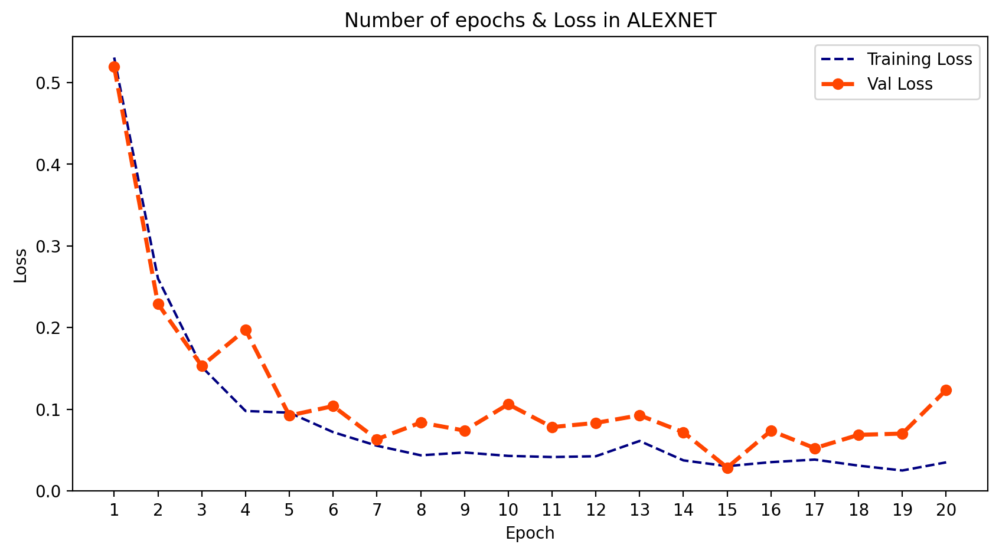

In [53]:
epoch_count = range(1, len(training_loss_alex) + 1)

# Visualize loss history
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, training_loss_alex, 'r--', color= 'navy')
plt.plot(epoch_count, val_loss_alex, '--bo',color= 'orangered', linewidth = '2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss in ALEXNET')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(1,21,1))
plt.show();

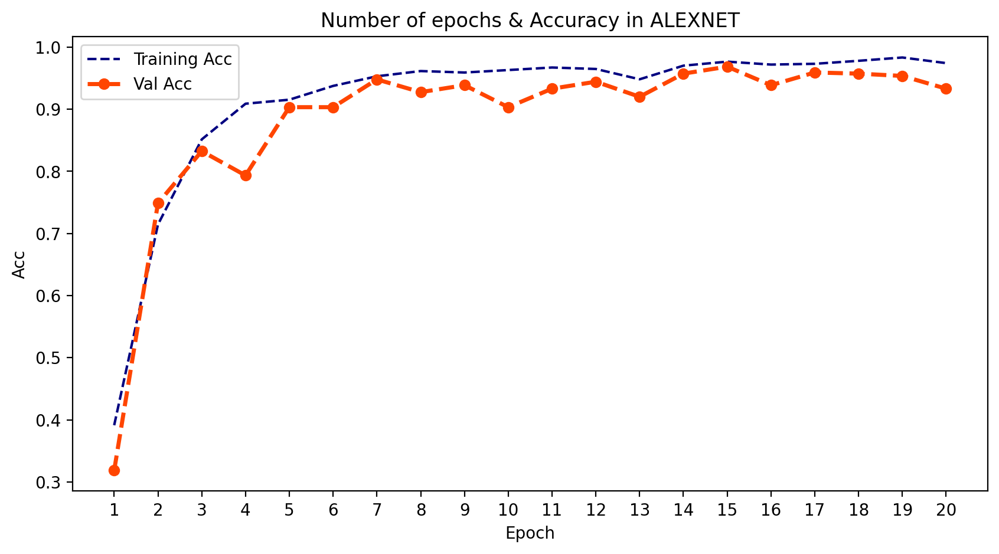

In [54]:
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, training_acc_alex, 'r--', color= 'navy')
plt.plot(epoch_count, val_acc_alex, '--bo',color= 'orangered', linewidth = '2.5', label='line with marker')
plt.legend(['Training Acc', 'Val Acc'])
plt.title('Number of epochs & Accuracy in ALEXNET')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,21,1))
plt.plot();
plt.show();

<a id="7"></a>
# <p style="padding:10px;background-color:#fab72f ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">VGGNet </p>

<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **1. What is VGGNet?**

  - VGGNet, also known as Visual Geometry Group, is a standard deep Convolutional Neural Network (CNN) architecture with multiple layers. The “deep” refers to the number of layers with VGG-16 or VGG-19 consisting of 16 and 19 convolutional layers, respectively. The VGG architecture is the basis of ground-breaking object recognition models. Developed as a deep neural network, the VGGNet also surpasses baselines on many tasks and datasets beyond ImageNet. Moreover, it is still one of the most popular image recognition architectures.
   


<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **2. Model Structure**

  - You can see the structure of VGGNet in the cell below.
   


In [55]:
def VGGNet():
    inp = layers.Input((240, 240, 3))
    x = layers.Conv2D(64, 3, 1, activation='relu')(inp)
    x = layers.Conv2D(64, 3, 1, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(2, 2)(x)
    x = layers.Conv2D(128, 3, 1, activation='relu')(x)
    x = layers.Conv2D(128, 3, 1, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(2, 2)(x)
    x = layers.Conv2D(256, 3, 1, activation='relu')(x)
    x = layers.Conv2D(256, 3, 1, activation='relu')(x)
    x = layers.Conv2D(256, 3, 1, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(2, 2)(x)
    x = layers.Conv2D(512, 3, 1, activation='relu')(x)
    x = layers.Conv2D(512, 3, 1, activation='relu')(x)
    x = layers.Conv2D(512, 3, 1, activation='relu')(x)
    x = layers.MaxPooling2D(2, 2)(x)
    x = layers.Flatten()(x)
    x = layers.Dense(4096, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(4096, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(5, activation='softmax')(x)

    model_VGG = models.Model(inputs=inp, outputs=x)

    return model_VGG

model_VGG = VGGNet()
model_VGG.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 conv2d_10 (Conv2D)          (None, 238, 238, 64)      1792      
                                                                 
 conv2d_11 (Conv2D)          (None, 236, 236, 64)      36928     
                                                                 
 batch_normalization_4 (Batc  (None, 236, 236, 64)     256       
 hNormalization)                                                 
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 118, 118, 64)     0         
 2D)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 116, 116, 128)     7385

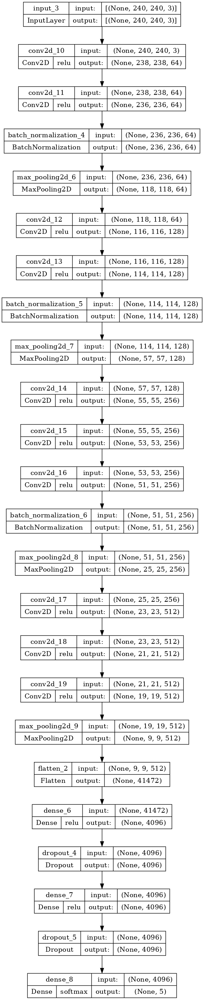

In [56]:
tf.keras.utils.plot_model(
    model_VGG,
    to_file='vgg_model.png',
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    show_layer_activations=True,
    dpi=100
)

In [57]:
model_VGG.compile(loss=BinaryCrossentropy(),
              optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

In [58]:
VGG_model = model_VGG.fit(trainDataset, epochs=20, validation_data=valDataset)
model_VGG.save_weights('/kaggle/working/model_VGG.h5')

Epoch 1/20
127/127 [==============================] - 145s 896ms/step - loss: 1.7271 - accuracy: 0.4826 - val_loss: 1.1487 - val_accuracy: 0.2086
Epoch 2/20
127/127 [==============================] - 108s 845ms/step - loss: 0.1635 - accuracy: 0.8510 - val_loss: 1.1145 - val_accuracy: 0.2309
Epoch 3/20
127/127 [==============================] - 108s 845ms/step - loss: 0.0929 - accuracy: 0.9193 - val_loss: 0.4363 - val_accuracy: 0.5605
Epoch 4/20
127/127 [==============================] - 108s 850ms/step - loss: 0.0788 - accuracy: 0.9352 - val_loss: 0.3665 - val_accuracy: 0.6629
Epoch 5/20
127/127 [==============================] - 108s 845ms/step - loss: 0.0554 - accuracy: 0.9543 - val_loss: 0.0532 - val_accuracy: 0.9590
Epoch 6/20
127/127 [==============================] - 108s 847ms/step - loss: 0.0354 - accuracy: 0.9719 - val_loss: 0.0732 - val_accuracy: 0.9367
Epoch 7/20
127/127 [==============================] - 107s 844ms/step - loss: 0.0273 - accuracy: 0.9764 - val_loss: 0.0425 -

<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **3. Output**

  - We can plot the output of model for each epoch. For this matter, we can use **.history** and extract the **train and valid loss and accuracy**. Then we can plot both of them and find out the path of learning.
   


In [59]:
training_loss_vgg = VGG_model.history['loss']
val_loss_vgg = VGG_model.history['val_loss']
training_acc_vgg = VGG_model.history['accuracy']
val_acc_vgg = VGG_model.history['val_accuracy']

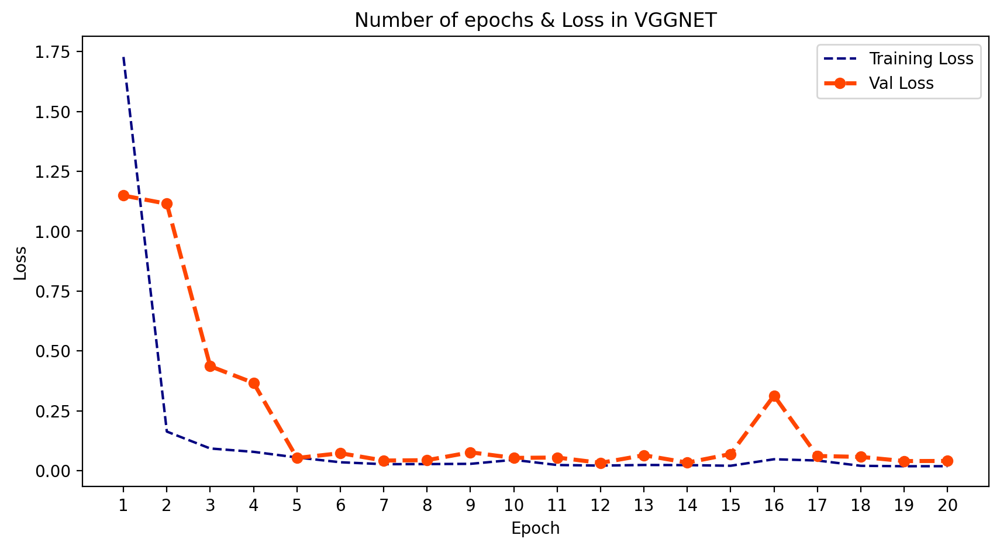

In [60]:
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, training_loss_vgg, 'r--', color= 'navy')
plt.plot(epoch_count, val_loss_vgg, '--bo',color= 'orangered', linewidth = '2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss in VGGNET')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(1,21,1))
plt.show();

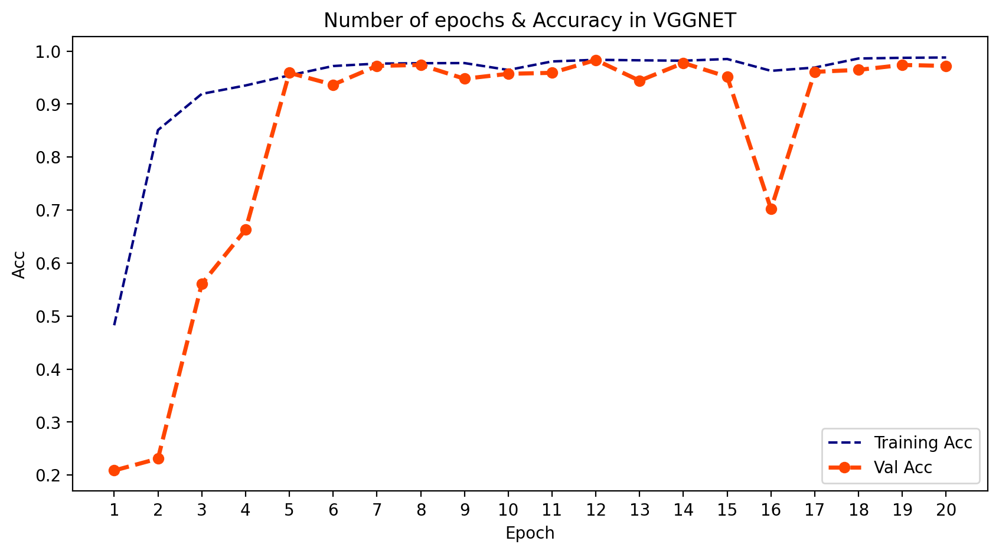

In [61]:
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, training_acc_vgg, 'r--', color= 'navy')
plt.plot(epoch_count, val_acc_vgg, '--bo',color= 'orangered', linewidth = '2.5', label='line with marker')
plt.legend(['Training Acc', 'Val Acc'])
plt.title('Number of epochs & Accuracy in VGGNET')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,21,1))
plt.plot();
plt.show();

<a id="8"></a>
# <p style="padding:10px;background-color:#fab72f ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">ResNet </p>

<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **1. What is ResNet?**

  - ResNet (Residual Network) is a deep learning-based model that uses residual connections to improve training performance and accuracy. The architecture of ResNet is designed to solve the problem of vanishing gradients that occurs when training deep neural networks. ResNet introduces the concept of residual blocks, which use skip connections to connect activations of a layer to further layers by skipping some layers in between. This forms a residual block, and ResNets are made by stacking these residual blocks together. The approach behind this network is instead of layers learning the underlying mapping, we allow the network to fit the residual mapping. So, instead of say H (x), initial mapping, let the network fit, F (x) := H (x) - x which gives H (x) := F (x) + x. The skip connection connects activations of a layer to further layers by skipping some layers in between. This results in training a very deep neural network without the problems caused by vanishing/exploding gradient. ResNet is widely used in image classification tasks and has inspired many other CNN architectures that have been developed since its introduction.
   



<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **2. Model Structure**

  - You can see the structure of Resnet34 in the cell below.
   


In [86]:
import tensorflow as tf
from tensorflow.keras import layers, models

def conv_block(x, filters, kernel_size=3, stride=1, downsample=False):
    identity = x
    if downsample:
        x = layers.Conv2D(filters, kernel_size, strides=stride, padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        identity = layers.Conv2D(filters, 1, strides=stride, padding='same', use_bias=False)(identity)
        identity = layers.BatchNormalization()(identity)
    else:
        x = layers.Conv2D(filters, kernel_size, strides=stride, padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)

    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, kernel_size, strides=1, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Add()([x, identity])
    x = layers.ReLU()(x)
    return x

def resnet34():
    inputs = layers.Input(shape=(240, 240, 3))
    x = layers.Conv2D(64, kernel_size=7, strides=2, padding='same', use_bias=False)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.MaxPooling2D(pool_size=3, strides=2, padding='same')(x)

    # Conv2_x
    x = conv_block(x, 64)
    x = conv_block(x, 64)
    x = conv_block(x, 64)

    # Conv3_x
    x = conv_block(x, 128, stride=2, downsample=True)
    x = conv_block(x, 128)
    x = conv_block(x, 128)
    x = conv_block(x, 128)

    # Conv4_x
    x = conv_block(x, 256, stride=2, downsample=True)
    x = conv_block(x, 256)
    x = conv_block(x, 256)
    x = conv_block(x, 256)
    x = conv_block(x, 256)
    x = conv_block(x, 256)

    # Conv5_x
    x = conv_block(x, 512, stride=2, downsample=True)
    x = conv_block(x, 512)
    x = conv_block(x, 512)

    x = layers.GlobalAveragePooling2D()(x)
    outputs = layers.Dense(5, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    return model

# Instantiate and compile the model
model_Res = resnet34()
model_Res.summary()


Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_362 (Conv2D)            (None, 120, 120, 64  9408        ['input_14[0][0]']               
                                )                                                                 
                                                                                                  
 batch_normalization_348 (Batch  (None, 120, 120, 64  256        ['conv2d_362[0][0]']             
 Normalization)                 )                                                          

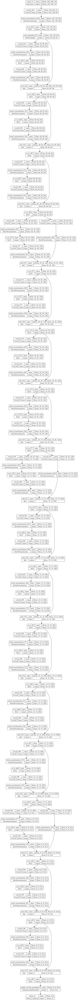

In [87]:
tf.keras.utils.plot_model(
    model_Res,
    to_file='res_model.png',
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    show_layer_activations=True,
    dpi=100
)

In [88]:
model_Res.compile(loss=BinaryCrossentropy(),
              optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

In [89]:
RES_model = model_Res.fit(trainDataset, epochs=20, validation_data=valDataset)
model_Res.save_weights('/kaggle/working/model_resnet34.h5')

Epoch 1/20
127/127 [==============================] - 72s 408ms/step - loss: 0.3369 - accuracy: 0.5963 - val_loss: 2.9890 - val_accuracy: 0.2048
Epoch 2/20
127/127 [==============================] - 47s 368ms/step - loss: 0.1242 - accuracy: 0.8895 - val_loss: 2.7433 - val_accuracy: 0.2421
Epoch 3/20
127/127 [==============================] - 47s 371ms/step - loss: 0.0718 - accuracy: 0.9395 - val_loss: 0.8231 - val_accuracy: 0.6369
Epoch 4/20
127/127 [==============================] - 47s 369ms/step - loss: 0.0692 - accuracy: 0.9410 - val_loss: 1.3348 - val_accuracy: 0.4451
Epoch 5/20
127/127 [==============================] - 50s 389ms/step - loss: 0.0593 - accuracy: 0.9521 - val_loss: 0.7109 - val_accuracy: 0.6890
Epoch 6/20
127/127 [==============================] - 56s 438ms/step - loss: 0.0302 - accuracy: 0.9750 - val_loss: 0.0298 - val_accuracy: 0.9721
Epoch 7/20
127/127 [==============================] - 47s 370ms/step - loss: 0.0191 - accuracy: 0.9848 - val_loss: 0.1044 - val_ac

<div style = 'border : 3px solid non; background-color:#1E90FF ; ;padding:10px'>


* **3. Output**

  - We can plot the output of model for each epoch. For this matter, we can use **.history** and extract the **train and valid loss and accuracy**. Then we can plot both of them and find out the path of learning.
   


In [90]:
training_loss_res = RES_model.history['loss']
val_loss_res = RES_model.history['val_loss']
training_acc_res = RES_model.history['accuracy']
val_acc_res = RES_model.history['val_accuracy']

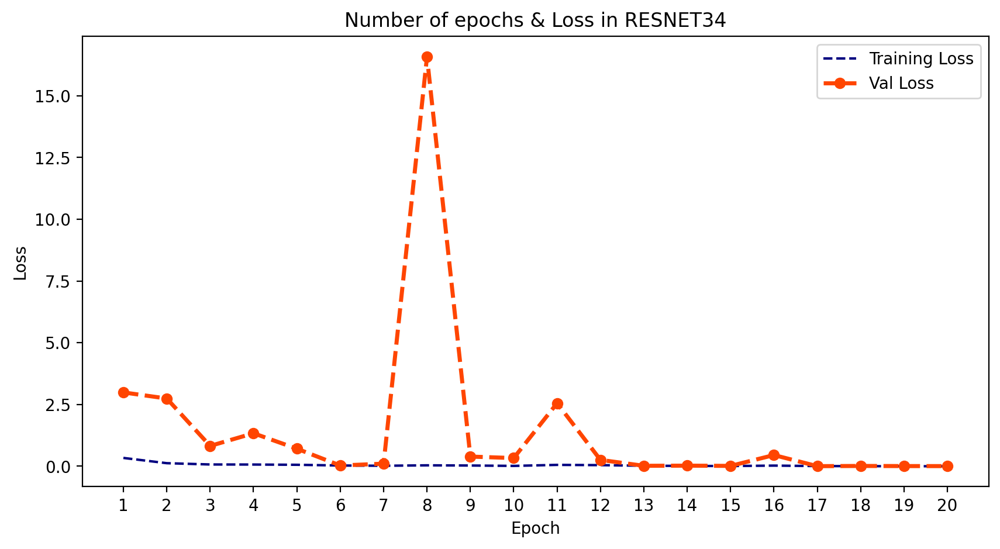

In [91]:
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, training_loss_res, 'r--', color= 'navy')
plt.plot(epoch_count, val_loss_res, '--bo',color= 'orangered', linewidth = '2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss in RESNET34')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(1,21,1))
plt.show();

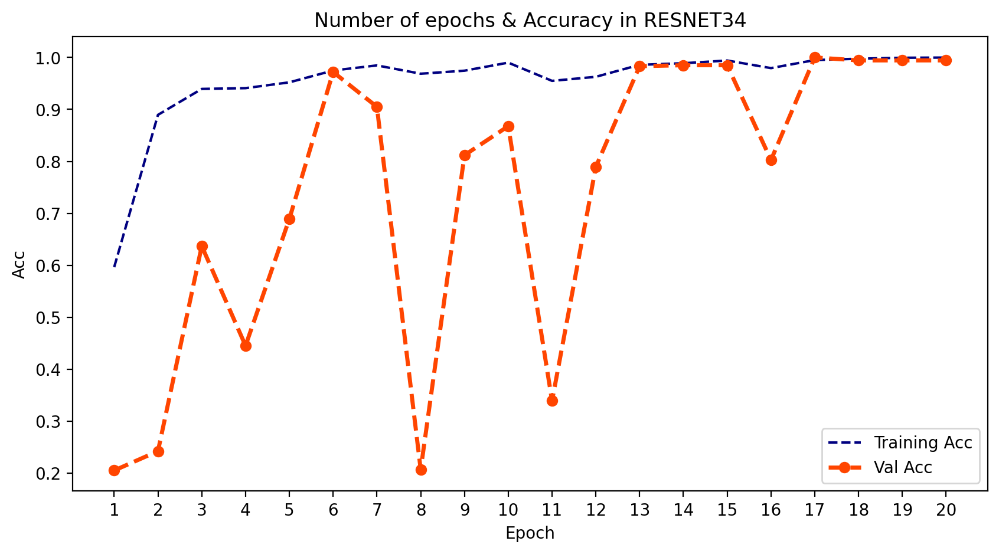

In [92]:
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, training_acc_res, 'r--', color= 'navy')
plt.plot(epoch_count, val_acc_res, '--bo',color= 'orangered', linewidth = '2.5', label='line with marker')
plt.legend(['Training Acc', 'Val Acc'])
plt.title('Number of epochs & Accuracy in RESNET34')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,21,1))
plt.plot();
plt.show();

<a id="8"></a>
# <p style="padding:10px;background-color:#fab72f ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">SimpleCNN </p>

In [93]:
def simple_cnn(img_width, img_height, num_classes):
    input_layer = Input(shape=(img_width, img_height, 3))
    
    x = layers.Conv2D(16, kernel_size=(3, 3), activation='relu', padding='same')(input_layer)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = layers.Conv2D(32, kernel_size=(3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = layers.Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = layers.Flatten()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    output_layer = layers.Dense(num_classes, activation='softmax', dtype='float32')(x)
    
    # Create the model
    model = Model(inputs=input_layer, outputs=output_layer)
    
    return model

num_classes = 5
model_simplecnn = simple_cnn(Img_width, Img_height, num_classes)
model_simplecnn.summary()

Model: "model_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_15 (InputLayer)       [(None, 240, 240, 3)]     0         
                                                                 
 conv2d_398 (Conv2D)         (None, 240, 240, 16)      448       
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 120, 120, 16)     0         
 g2D)                                                            
                                                                 
 conv2d_399 (Conv2D)         (None, 120, 120, 32)      4640      
                                                                 
 max_pooling2d_22 (MaxPoolin  (None, 60, 60, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_400 (Conv2D)         (None, 60, 60, 64)        184

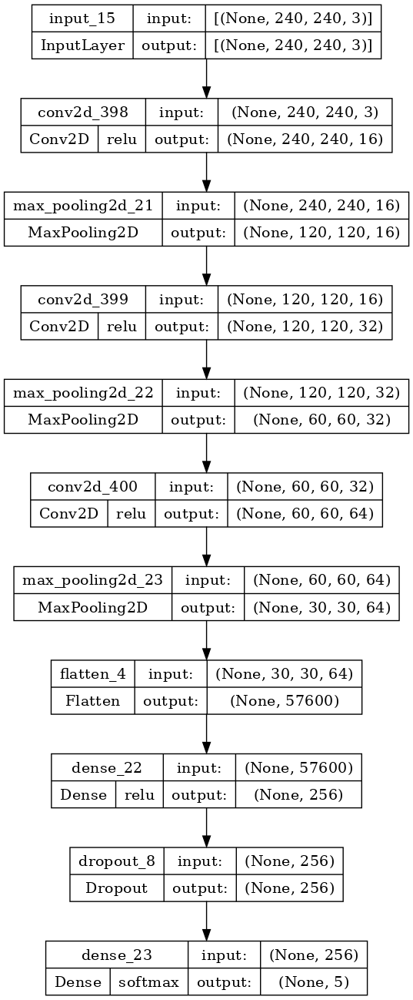

In [95]:
tf.keras.utils.plot_model(
    model_simplecnn,
    to_file='simplecnn_model.png',
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    show_layer_activations=True,
    dpi=100
)

In [96]:
model_simplecnn.compile(loss=BinaryCrossentropy(),
              optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

In [97]:
SimpleCnn_model = model_simplecnn.fit(trainDataset, epochs=20, validation_data=valDataset)
model_simplecnn.save_weights('/kaggle/working/model_SimpleCNN.h5')

Epoch 1/20
127/127 [==============================] - 41s 299ms/step - loss: 0.3807 - accuracy: 0.5539 - val_loss: 0.1263 - val_accuracy: 0.8994
Epoch 2/20
127/127 [==============================] - 37s 289ms/step - loss: 0.1150 - accuracy: 0.9073 - val_loss: 0.0421 - val_accuracy: 0.9721
Epoch 3/20
127/127 [==============================] - 38s 299ms/step - loss: 0.0583 - accuracy: 0.9588 - val_loss: 0.0221 - val_accuracy: 0.9851
Epoch 4/20
127/127 [==============================] - 37s 288ms/step - loss: 0.0361 - accuracy: 0.9742 - val_loss: 0.0154 - val_accuracy: 0.9851
Epoch 5/20
127/127 [==============================] - 38s 295ms/step - loss: 0.0298 - accuracy: 0.9773 - val_loss: 0.0165 - val_accuracy: 0.9888
Epoch 6/20
127/127 [==============================] - 37s 290ms/step - loss: 0.0238 - accuracy: 0.9841 - val_loss: 0.0160 - val_accuracy: 0.9870
Epoch 7/20
127/127 [==============================] - 38s 295ms/step - loss: 0.0209 - accuracy: 0.9843 - val_loss: 0.0108 - val_ac

In [98]:
training_loss_simplecnn = SimpleCnn_model.history['loss']
val_loss_simplecnn = SimpleCnn_model.history['val_loss']
training_acc_simplecnn = SimpleCnn_model.history['accuracy']
val_acc_simplecnn = SimpleCnn_model.history['val_accuracy']

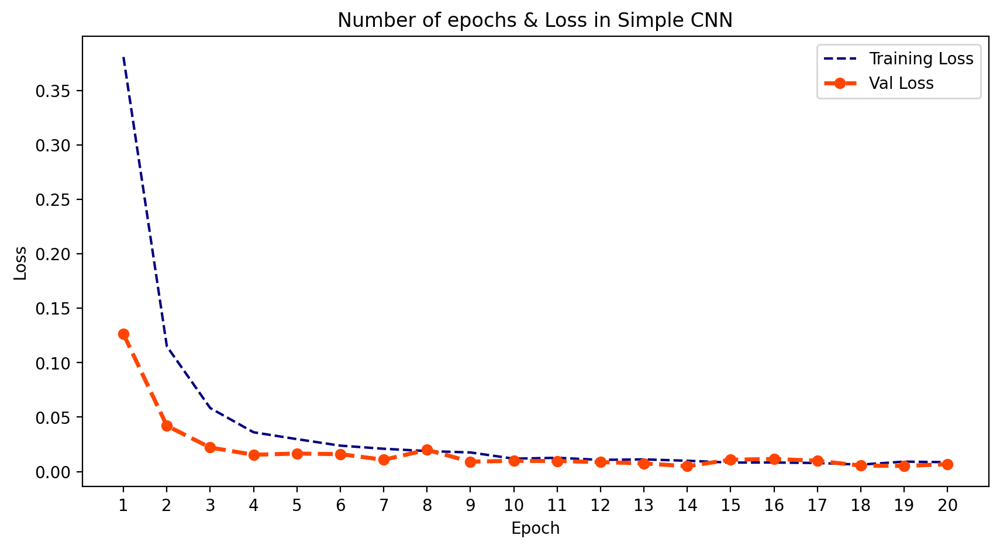

In [99]:
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, training_loss_simplecnn, 'r--', color= 'navy')
plt.plot(epoch_count, val_loss_simplecnn, '--bo',color= 'orangered', linewidth = '2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss in Simple CNN')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(1,21,1))
plt.show();

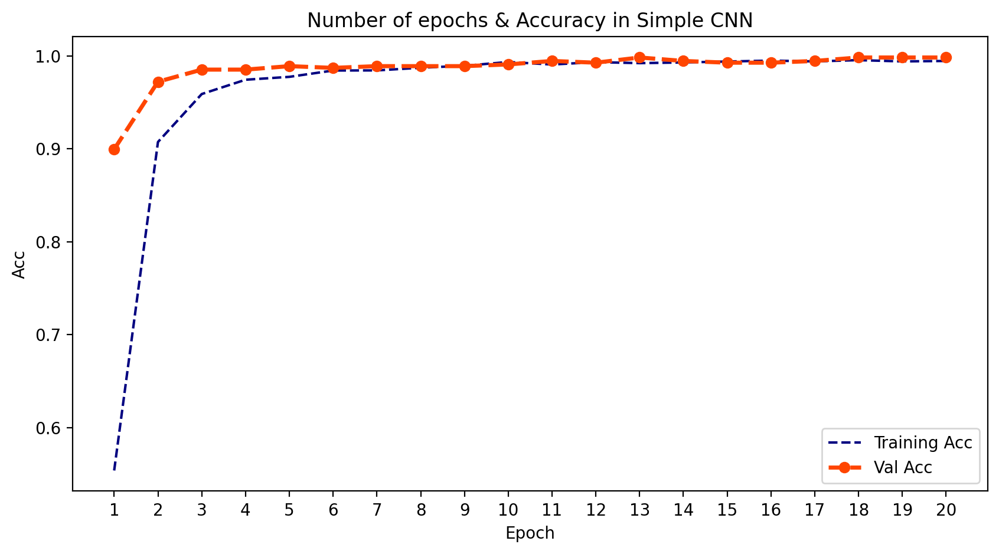

In [100]:
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, training_acc_simplecnn, 'r--', color= 'navy')
plt.plot(epoch_count, val_acc_simplecnn, '--bo',color= 'orangered', linewidth = '2.5', label='line with marker')
plt.legend(['Training Acc', 'Val Acc'])
plt.title('Number of epochs & Accuracy in Simple CNN')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,21,1))
plt.plot();
plt.show();

<a id="8"></a>
# <p style="padding:10px;background-color:#fab72f ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Double Parallel CNN </p>

In [101]:
def create_parallel_cnn(img_width, img_height, num_classes):
    input_layer = Input(shape=(img_width, img_height, 3))
    
    # First CNN model
    cnn1 = layers.Conv2D(16, kernel_size=(3, 3), activation='relu', padding='same')(input_layer)
    cnn1 = layers.MaxPooling2D(pool_size=(2, 2))(cnn1)
    cnn1 = layers.Conv2D(32, kernel_size=(3, 3), activation='relu', padding='same')(cnn1)
    cnn1 = layers.MaxPooling2D(pool_size=(2, 2))(cnn1)
    cnn1 = layers.Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same')(cnn1)
    cnn1 = layers.MaxPooling2D(pool_size=(2, 2))(cnn1)
    cnn1 = layers.Flatten()(cnn1)
    
    # Second CNN model
    cnn2 = layers.Conv2D(16, kernel_size=(5, 5), activation='relu', padding='same')(input_layer)
    cnn2 = layers.MaxPooling2D(pool_size=(2, 2))(cnn2)
    cnn2 = layers.Conv2D(32, kernel_size=(5, 5), activation='relu', padding='same')(cnn2)
    cnn2 = layers.MaxPooling2D(pool_size=(2, 2))(cnn2)
    cnn2 = layers.Conv2D(64, kernel_size=(5, 5), activation='relu', padding='same')(cnn2)
    cnn2 = layers.MaxPooling2D(pool_size=(2, 2))(cnn2)
    cnn2 = layers.Flatten()(cnn2)
    
    # Concatenate the outputs of the two CNN models
    combined = layers.concatenate([cnn1, cnn2])
    
    # Add fully connected layers
    combined = layers.Dense(256, activation='relu')(combined)
    combined = layers.Dropout(0.5)(combined)
    output_layer = layers.Dense(num_classes, activation='softmax', dtype='float32')(combined)
    
    # Create the model
    model = Model(inputs=input_layer, outputs=output_layer)
    
    return model

num_classes = 5
model_2cnn = create_parallel_cnn(Img_width, Img_height, num_classes)
model_2cnn.summary()

Model: "model_15"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_16 (InputLayer)          [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_401 (Conv2D)            (None, 240, 240, 16  448         ['input_16[0][0]']               
                                )                                                                 
                                                                                                  
 conv2d_404 (Conv2D)            (None, 240, 240, 16  1216        ['input_16[0][0]']               
                                )                                                          

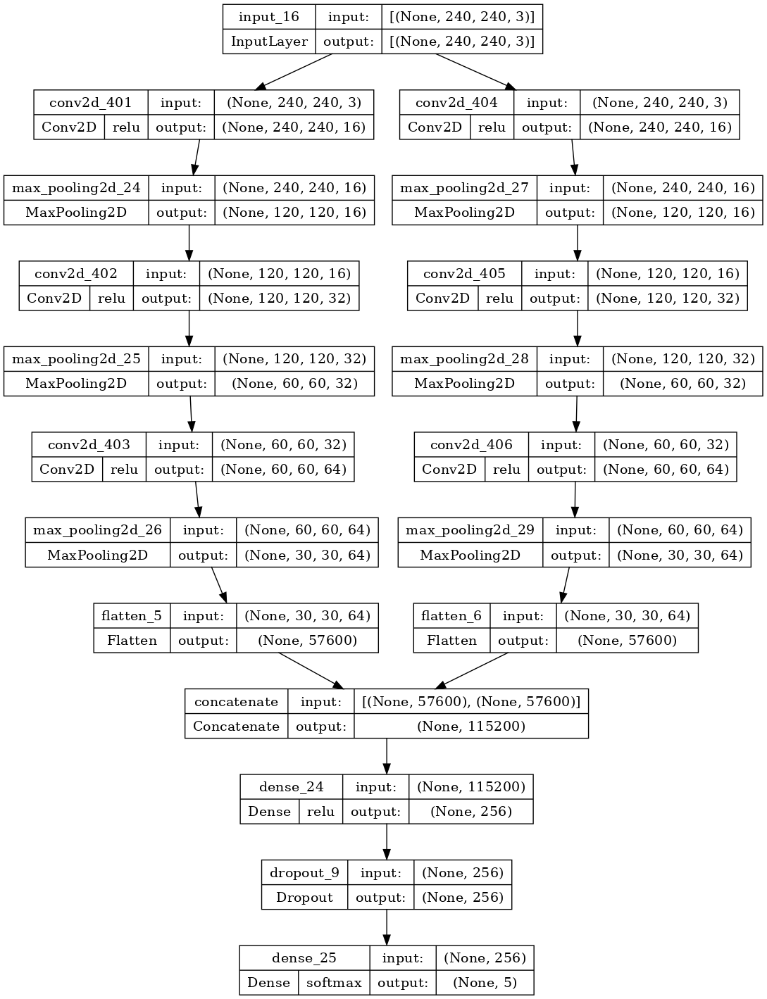

In [102]:
tf.keras.utils.plot_model(
    model_2cnn,
    to_file='doublecnn_model.png',
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    show_layer_activations=True,
    dpi=100
)

In [103]:
model_2cnn.compile(loss=BinaryCrossentropy(),
              optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

In [104]:
DoubleCnn_model = model_2cnn.fit(trainDataset, epochs=20, validation_data=valDataset)
model_2cnn.save_weights('/kaggle/working/model_2CNN.h5')

Epoch 1/20
127/127 [==============================] - 55s 391ms/step - loss: 0.3963 - accuracy: 0.5724 - val_loss: 0.1219 - val_accuracy: 0.9069
Epoch 2/20
127/127 [==============================] - 39s 304ms/step - loss: 0.1216 - accuracy: 0.9004 - val_loss: 0.0580 - val_accuracy: 0.9423
Epoch 3/20
127/127 [==============================] - 37s 293ms/step - loss: 0.0662 - accuracy: 0.9525 - val_loss: 0.0275 - val_accuracy: 0.9851
Epoch 4/20
127/127 [==============================] - 38s 300ms/step - loss: 0.0414 - accuracy: 0.9715 - val_loss: 0.0226 - val_accuracy: 0.9870
Epoch 5/20
127/127 [==============================] - 38s 297ms/step - loss: 0.0330 - accuracy: 0.9750 - val_loss: 0.0169 - val_accuracy: 0.9926
Epoch 6/20
127/127 [==============================] - 38s 298ms/step - loss: 0.0240 - accuracy: 0.9826 - val_loss: 0.0146 - val_accuracy: 0.9888
Epoch 7/20
127/127 [==============================] - 40s 311ms/step - loss: 0.0242 - accuracy: 0.9821 - val_loss: 0.0185 - val_ac

In [105]:
training_loss_2cnn = DoubleCnn_model.history['loss']
val_loss_2cnn = DoubleCnn_model.history['val_loss']
training_acc_2cnn = DoubleCnn_model.history['accuracy']
val_acc_2cnn = DoubleCnn_model.history['val_accuracy']

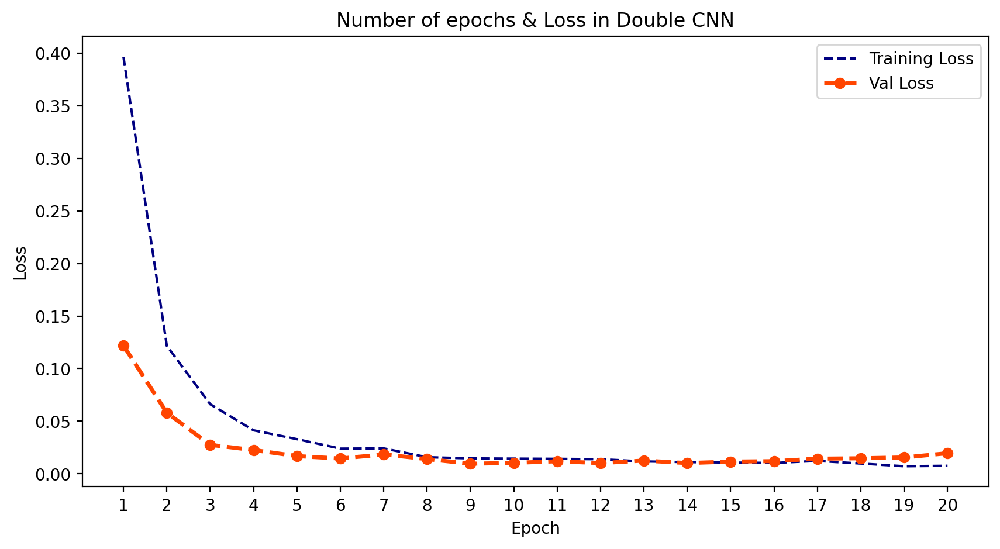

In [106]:
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, training_loss_2cnn, 'r--', color= 'navy')
plt.plot(epoch_count, val_loss_2cnn, '--bo',color= 'orangered', linewidth = '2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss in Double CNN')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(1,21,1))
plt.show();

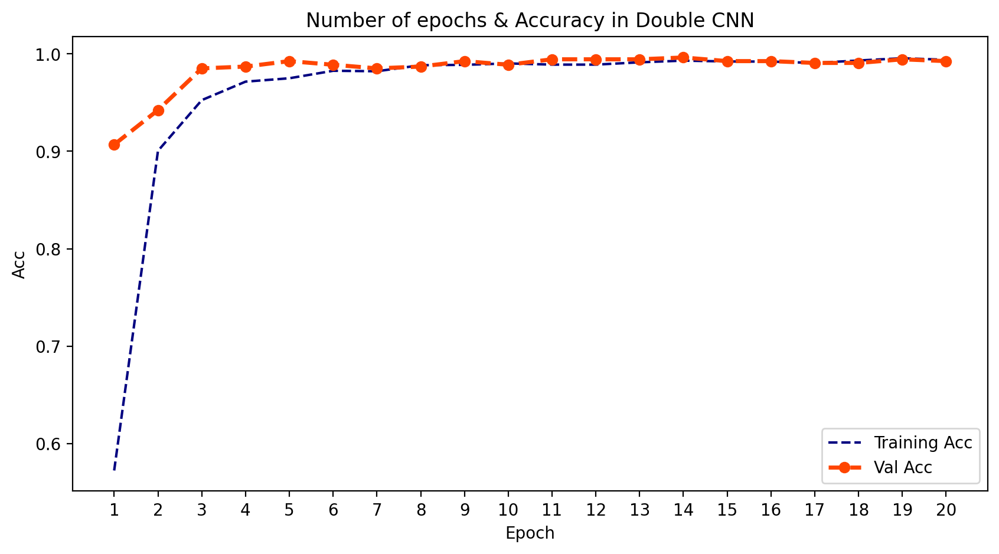

In [107]:
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, training_acc_2cnn, 'r--', color= 'navy')
plt.plot(epoch_count, val_acc_2cnn, '--bo',color= 'orangered', linewidth = '2.5', label='line with marker')
plt.legend(['Training Acc', 'Val Acc'])
plt.title('Number of epochs & Accuracy in Double CNN')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,21,1))
plt.plot();
plt.show();

<a id="9"></a>
# <p style="padding:10px;background-color:#fab72f ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Result </p>

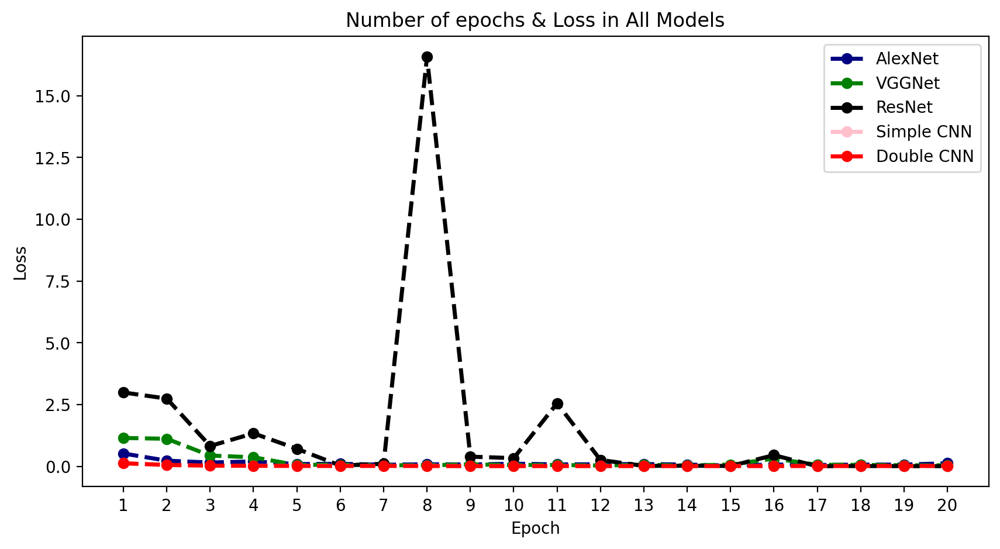

In [108]:
plt.figure(figsize=(10,5), dpi=200)

plt.plot(epoch_count, val_loss_alex, '--bo',color= 'navy',
         linewidth = '2.5', label='line with marker')
plt.plot(epoch_count, val_loss_vgg, '--bo',color= 'green',
         linewidth = '2.5', label='line with marker')
plt.plot(epoch_count, val_loss_res, '--bo',color= 'black',
         linewidth = '2.5', label='line with marker')
plt.plot(epoch_count, val_loss_simplecnn, '--bo',color= 'pink',
         linewidth = '2.5', label='line with marker')
plt.plot(epoch_count, val_loss_2cnn, '--bo',color= 'red',
         linewidth = '2.5', label='line with marker')
plt.legend(['AlexNet', 'VGGNet','ResNet','Simple CNN', 'Double CNN'])
plt.title('Number of epochs & Loss in All Models')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(1,21,1))
plt.show();

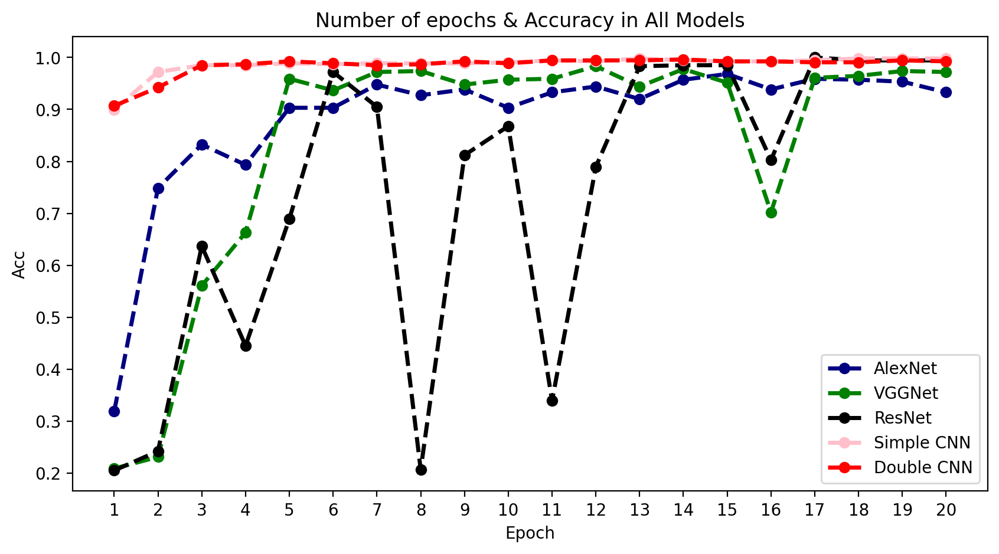

In [109]:
plt.figure(figsize=(10,5), dpi=200)

plt.plot(epoch_count, val_acc_alex, '--bo',color= 'navy',
         linewidth = '2.5', label='line with marker')
plt.plot(epoch_count, val_acc_vgg, '--bo',color= 'green',
         linewidth = '2.5', label='line with marker')
plt.plot(epoch_count, val_acc_res, '--bo',color= 'black',
         linewidth = '2.5', label='line with marker')
plt.plot(epoch_count, val_acc_simplecnn, '--bo',color= 'pink',
         linewidth = '2.5', label='line with marker')
plt.plot(epoch_count, val_acc_2cnn, '--bo',color= 'red',
         linewidth = '2.5', label='line with marker')
plt.legend(['AlexNet', 'VGGNet','ResNet','Simple CNN','Double CNN'])
plt.title('Number of epochs & Accuracy in All Models')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,21,1))
plt.show();

<a id="8"></a>
# <p style="padding:10px;background-color:#fab72f ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Using the best model to predict </p>

In [113]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras import layers, Input
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import Adam

def simple_cnn(img_width, img_height, num_classes):
    input_layer = Input(shape=(img_width, img_height, 3))
    
    x = layers.Conv2D(16, kernel_size=(3, 3), activation='relu', padding='same')(input_layer)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = layers.Conv2D(32, kernel_size=(3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = layers.Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = layers.Flatten()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    output_layer = layers.Dense(num_classes, activation='softmax', dtype='float32')(x)
    
    # Create the model
    model = Model(inputs=input_layer, outputs=output_layer)
    
    return model

num_classes = 5
img_width, img_height = 240, 240
model_simplecnn = simple_cnn(img_width, img_height, num_classes)

model_simplecnn.load_weights('/kaggle/working/model_SimpleCNN.h5')



In [117]:
class_names = ['Other', 'Safe Driving', 'Talking Phone', 'Texting Phone', 'Turning']

2/2 [==============================] - 0s 10ms/step
               precision    recall  f1-score   support

        Other       1.00      0.97      0.99       117
 Safe Driving       1.00      1.00      1.00       116
Talking Phone       0.99      0.99      0.99       116
Texting Phone       0.99      1.00      1.00       115
      Turning       0.98      1.00      0.99       112

     accuracy                           0.99       576
    macro avg       0.99      0.99      0.99       576
 weighted avg       0.99      0.99      0.99       576



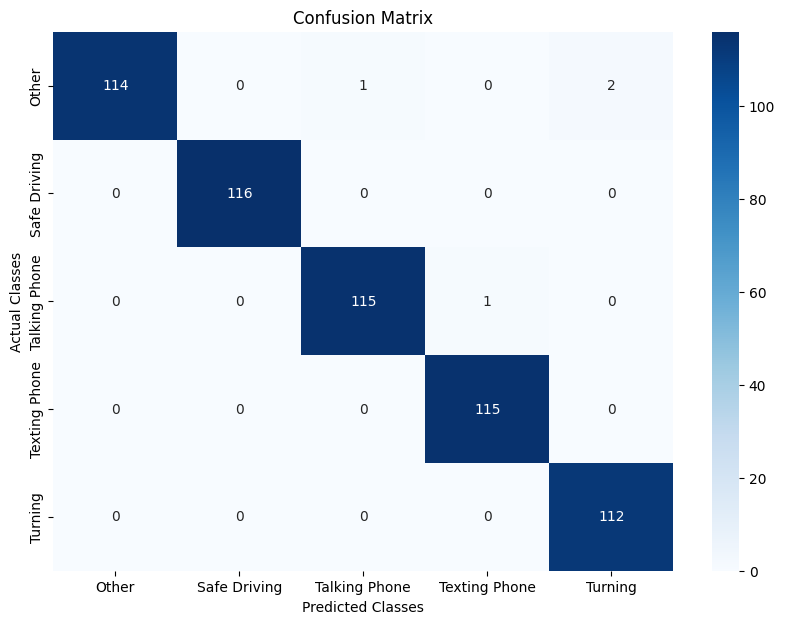

In [120]:
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt


y_pred = []
y_true = []

for batch, labels in testDataset:
    preds = model_simplecnn.predict(batch)
    preds = np.argmax(preds, axis=1)
    labels = np.argmax(labels, axis=1)
    y_pred.extend(preds)
    y_true.extend(labels)
    
    # Nếu không muốn xử lý toàn bộ tập dữ liệu một lần, có thể giới hạn số batch
    if len(y_pred) >= len(val_df):
        break

conf_matrix = confusion_matrix(y_true, y_pred)
print(classification_report(y_true, y_pred, target_names=class_names))

plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.ylabel('Actual Classes')
plt.xlabel('Predicted Classes')
plt.show()


1/1 [==============================] - 0s 20ms/step


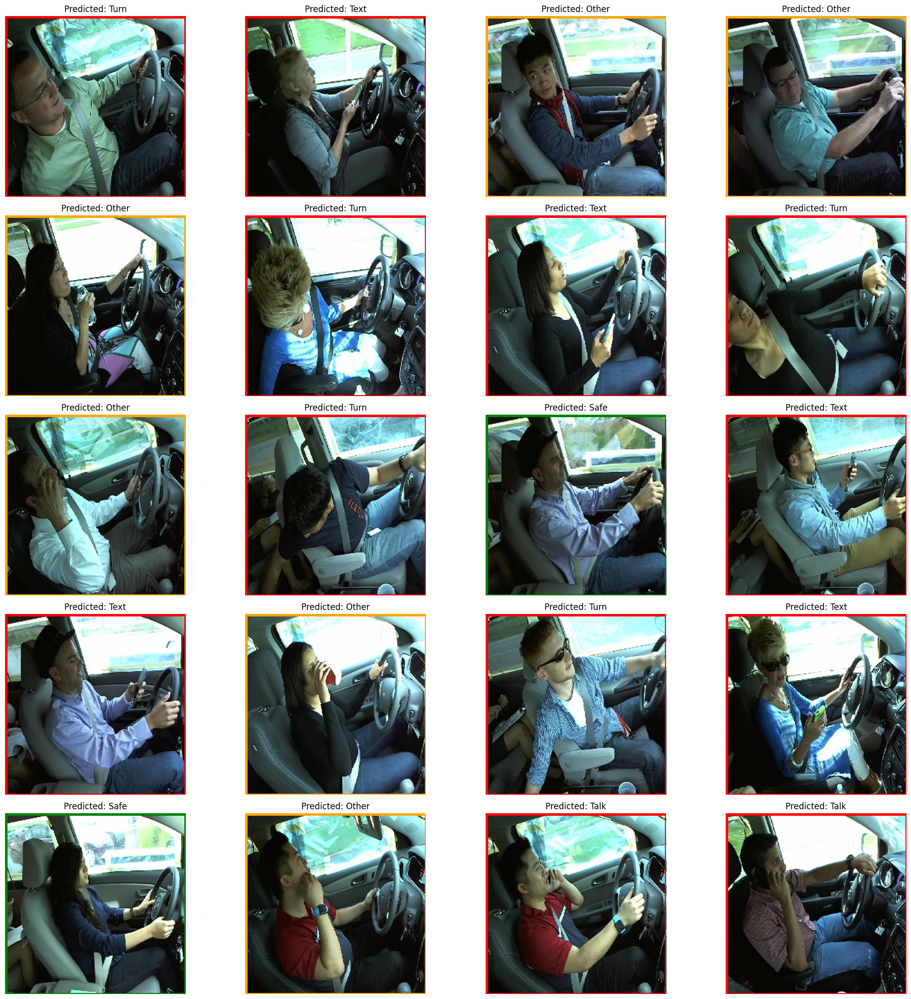

In [121]:
import random
import numpy as np
from skimage.io import imread
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Định nghĩa các tên lớp và màu viền tương ứng
class_names = ['Other', 'Safe', 'Talk', 'Text', 'Turn']
border_colors = {'Other': 'orange', 'Safe': 'green', 'Talk': 'red', 'Text': 'red', 'Turn': 'red'}

# Chọn ngẫu nhiên 20 tấm ảnh từ tập test
sample_images = random.sample(list(test_df['image']), 20)

# Vẽ các tấm ảnh và dự đoán nhãn của chúng
plt.figure(figsize=(20, 20))
for i, img_path in enumerate(sample_images):
    # Load và xử lý ảnh
    img = load_img(img_path, target_size=(Img_height, Img_width))
    img_array = img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)
    
    # Dự đoán nhãn
    prediction = model_simplecnn.predict(img_array)
    predicted_class = class_names[np.argmax(prediction, axis=1)[0]]
    
    # Hiển thị ảnh và viền màu
    plt.subplot(5, 4, i + 1)
    plt.imshow(img)
    plt.title(f"Predicted: {predicted_class}")
    plt.axis('off')
    
    # Thêm viền màu dựa trên nhãn
    ax = plt.gca()
    rect = patches.Rectangle((0, 0), Img_width, Img_height, linewidth=5, edgecolor=border_colors[predicted_class], facecolor='none')
    ax.add_patch(rect)

plt.tight_layout()
plt.show()


In [123]:
import cv2
import numpy as np
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import load_model
from matplotlib.patches import Rectangle

# # Định nghĩa các tên lớp và màu viền tương ứng
# class_names = ['Other', 'Safe', 'Talk', 'Text', 'Turn']
# border_colors = {'Other': 'orange', 'Safe': 'green', 'Talk': 'red', 'Text': 'red', 'Turn': 'red'}

# # Load mô hình đã huấn luyện
# model_simplecnn.load_weights('/kaggle/working/model_SimpleCNN.h5')

# Hàm để dự đoán nhãn và thêm viền màu cho khung hình

def predict_and_draw_border(frame, model):
    img = cv2.resize(frame, (Img_width, Img_height))
    img_array = img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)
    
    # Dự đoán nhãn
    prediction = model.predict(img_array)
    predicted_class = class_names[np.argmax(prediction, axis=1)[0]]
    
    # Thêm viền màu vào khung hình
    color = border_colors[predicted_class]
    frame = cv2.rectangle(frame, (0, 0), (frame.shape[1], frame.shape[0]), color, 10)
    cv2.putText(frame, f"Predicted: {predicted_class}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 2, cv2.LINE_AA)
    
    return frame

# Đọc video
video_path = 'path_to_your_video.mp4'
cap = cv2.VideoCapture(video_path)

# Kiểm tra xem video có được mở thành công không
if not cap.isOpened():
    print("Error: Could not open video.")
    exit()

# Đọc và xử lý từng khung hình
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    
    # Dự đoán và thêm viền màu
    frame_with_border = predict_and_draw_border(frame, model_simplecnn)
    
    # Hiển thị khung hình
    cv2.imshow('Video', frame_with_border)
    
    # Thoát nếu nhấn phím 'q'
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Giải phóng tài nguyên
cap.release()
cv2.destroyAllWindows()

Error: Could not open video.


error: OpenCV(4.8.0) /io/opencv/modules/highgui/src/window.cpp:1266: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvDestroyAllWindows'
